## Fashion classification
We will be doing multi-class classification with this dataset.

Dataset:

* Full: https://github.com/alexeygrigorev/clothing-dataset
* Small: https://github.com/alexeygrigorev/clothing-dataset-small

#### Links:

* https://cs231n.github.io/

In [1]:
! git clone https://github.com/alexeygrigorev/clothing-dataset

Cloning into 'clothing-dataset'...
remote: Enumerating objects: 5792, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 5792 (delta 13), reused 3 (delta 1), pack-reused 5766
Receiving objects: 100% (5792/5792), 152.92 MiB | 16.27 MiB/s, done.
Resolving deltas: 100% (14/14), done.
Checking out files: 100% (5759/5759), done.


In [2]:
!git clone https://github.com/alexeygrigorev/clothing-dataset-small

Cloning into 'clothing-dataset-small'...
remote: Enumerating objects: 3839, done.
remote: Counting objects: 100% (400/400), done.
remote: Compressing objects: 100% (400/400), done.
remote: Total 3839 (delta 9), reused 385 (delta 0), pack-reused 3439
Receiving objects: 100% (3839/3839), 100.58 MiB | 16.72 MiB/s, done.
Resolving deltas: 100% (10/10), done.


In [3]:
import tensorflow as tf
from tensorflow import keras
from PIL import Image 
#
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

## Load Image using keras

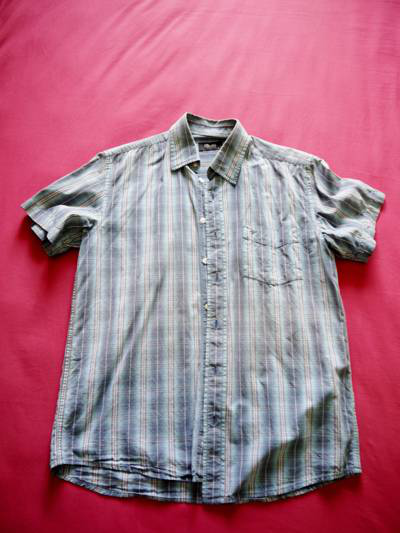

In [4]:
from tensorflow.keras.preprocessing.image import load_img
import os
path  = "/content/clothing-dataset-small/train/shirt"
img = "005d3a4d-b8cc-4f14-a288-8065ab797974.jpg"
full_path = os.path.join(path,img)
load_img(full_path)

## Image resize
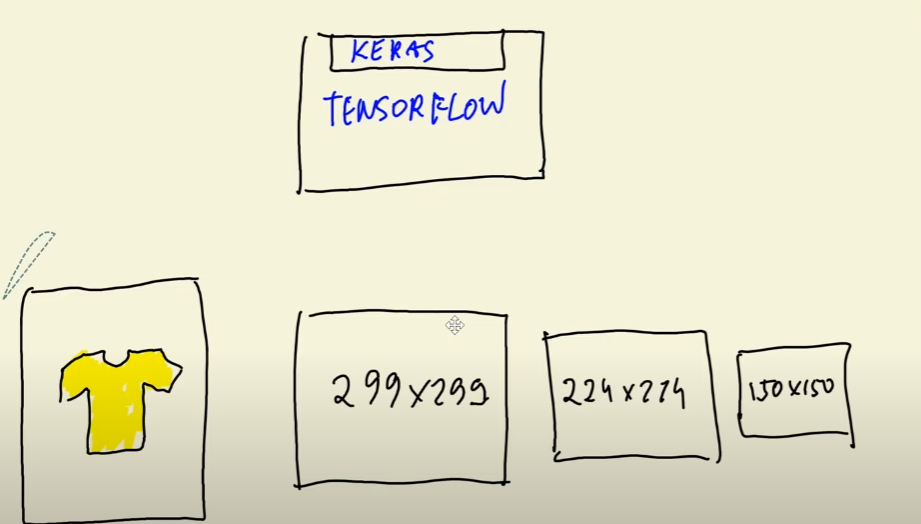

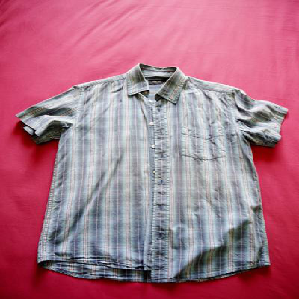

In [5]:
load_img(full_path,target_size=(299,299))

In [6]:
final_img = load_img(full_path,target_size=(299,299))

In [7]:
type(final_img)

PIL.Image.Image

## Representation of Images Internally

* The final size of the PIL image can be calculated as (h, w, c), where h is the height of the image, w is the width and c is the number of channels in the image
* PIL images can easily be converted to NumPy arrays of dtype=uint8 (unsigned integers of size 8 bits):

    - **x = np.array(img)**

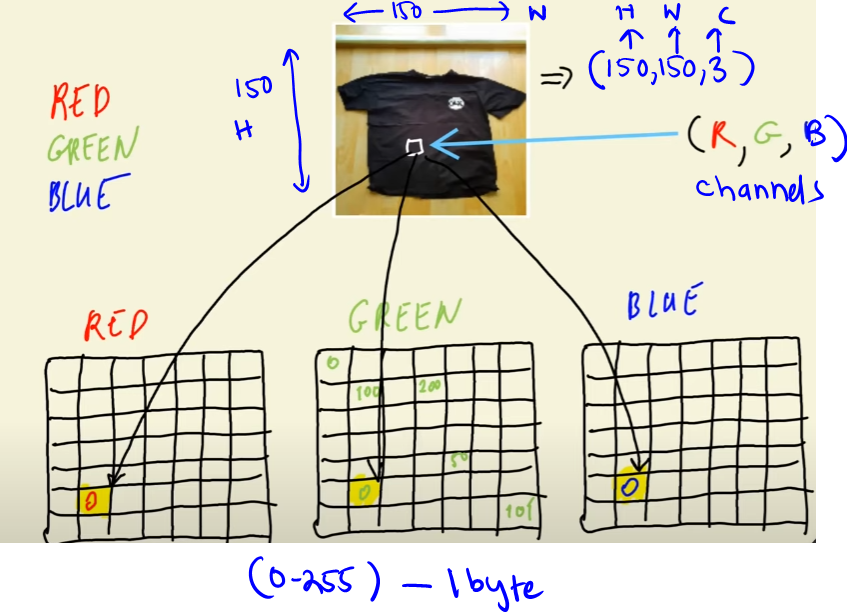

In [8]:
np.array(final_img)

array([[[146,  14,  51],
        [156,  24,  61],
        [165,  33,  70],
        ...,
        [198,  67, 111],
        [198,  67, 111],
        [198,  67, 111]],

       [[147,  15,  52],
        [167,  35,  72],
        [172,  40,  77],
        ...,
        [190,  59, 103],
        [191,  60, 104],
        [192,  61, 105]],

       [[150,  18,  55],
        [171,  39,  76],
        [171,  39,  76],
        ...,
        [197,  66, 110],
        [195,  64, 108],
        [194,  63, 107]],

       ...,

       [[101,   1,  11],
        [102,   0,  11],
        [103,   1,  12],
        ...,
        [114,   3,  10],
        [113,   2,   9],
        [112,   3,   8]],

       [[101,   1,  11],
        [102,   0,  11],
        [103,   1,  12],
        ...,
        [114,   3,  10],
        [113,   2,   9],
        [112,   3,   8]],

       [[101,   1,  11],
        [102,   0,  11],
        [103,   1,  12],
        ...,
        [114,   3,  10],
        [113,   2,   9],
        [112,   3,   8]]

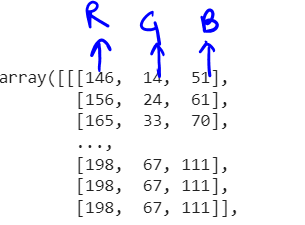

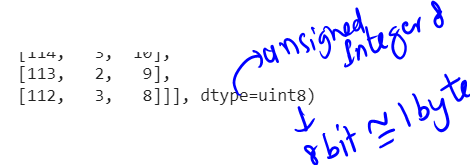

In [9]:
x = np.array(final_img)

In [10]:
x.shape

(299, 299, 3)

In [11]:
X = np.array([x])

In [12]:
X.shape

(1, 299, 299, 3)

## Pre-trained convolutional neural networks

Instead of training a DNN from scratch, we can use a pre-trained network in order to speed up work. There are many pre-trained networks available online.

The standard training dataset for general image classification is ImageNet, a dataset with over a million images in 1000 different categories.

For this example we will use a Xception network pre-trained on ImageNet.

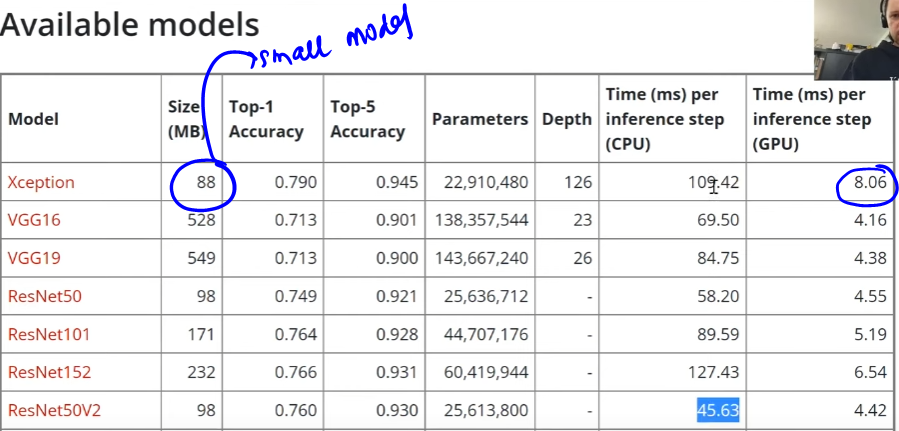

In [13]:
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.xception import preprocess_input
from tensorflow.keras.applications.xception import decode_predictions
model = Xception(weights='imagenet',input_shape=(299, 299, 3))

91884032/91884032 [==============================] - 7s 0us/step


In [14]:
#Preprocess Image
X = preprocess_input(X)

pred = model.predict(X)
# Decode Predictions to detect the image from 1000 images
decode_predictions(pred)

35363/35363 [==============================] - 0s 0us/step


[[('n04525038', 'velvet', 0.14347564),
  ('n03877472', 'pajama', 0.124965705),
  ('n03595614', 'jersey', 0.12118909),
  ('n03594734', 'jean', 0.053121112),
  ('n04479046', 'trench_coat', 0.04725361)]]

* https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json - 1000 images

In [15]:
print(X[0])

[[[ 0.14509809 -0.8901961  -0.6       ]
  [ 0.22352946 -0.8117647  -0.52156866]
  [ 0.2941177  -0.7411765  -0.45098037]
  ...
  [ 0.5529412  -0.47450978 -0.12941176]
  [ 0.5529412  -0.47450978 -0.12941176]
  [ 0.5529412  -0.47450978 -0.12941176]]

 [[ 0.15294123 -0.88235295 -0.5921569 ]
  [ 0.30980396 -0.7254902  -0.4352941 ]
  [ 0.34901965 -0.6862745  -0.3960784 ]
  ...
  [ 0.4901961  -0.5372549  -0.19215685]
  [ 0.49803925 -0.5294118  -0.18431371]
  [ 0.5058824  -0.52156866 -0.17647058]]

 [[ 0.17647064 -0.85882354 -0.5686275 ]
  [ 0.3411765  -0.69411767 -0.40392154]
  [ 0.3411765  -0.69411767 -0.40392154]
  ...
  [ 0.54509807 -0.4823529  -0.1372549 ]
  [ 0.5294118  -0.4980392  -0.15294117]
  [ 0.52156866 -0.5058824  -0.1607843 ]]

 ...

 [[-0.20784312 -0.99215686 -0.9137255 ]
  [-0.19999999 -1.         -0.9137255 ]
  [-0.19215685 -0.99215686 -0.90588236]
  ...
  [-0.10588235 -0.9764706  -0.92156863]
  [-0.11372548 -0.9843137  -0.92941177]
  [-0.12156862 -0.9764706  -0.9372549 ]]

 [

Pre-trained DNN's are useful for speeding up work, but they may have been pretrained for tasks that do not match our needs. For example, if we want to work with Fashion-MNIST, a dataset that contains images of clothing, and we want to correctly classify images of T-shirts, we cannot use the code above because ImageNet does not have a T-shirt category, and we end up classifying a T-shirt picture as a jersey, a sweatshirt or even a bulletproof vest.

## Convolutional Neural Networks

A **Convolutional Neural Network (CNN)** is a type of DNN that is well suited for dealing with images. 

* The Xception network used in the previous section is an example of CNN.

**CNN**'s have 2 type of layers: **convolutional** and **dense**, as well as a special type called **pooling**:

* A convolutional layer (CL) is made of **"filters"**: matrices that **recognize specific patterns**. 
* The **filters** move accross the image and create an output consisting of a **"similarity array"**, or a **filtered image** where every **"region"** has a higher value **the more similar it is to the filter**. 
* These outputs are called **feature maps**.

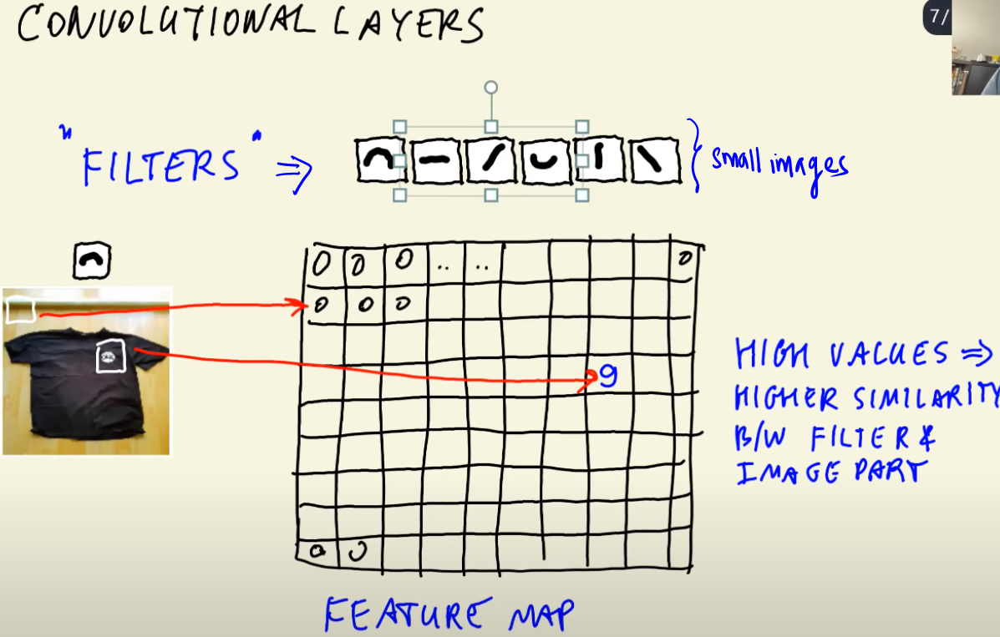

* Each filter will output a feature map, so the output of the convolutional layer will have as many feature maps as filters.
* These feature maps are then passed to another convolutional layer with its own set of filters, which will output another set of feature maps, which can then be sent to another CL, and so on. 
* For example, a CL with 6 filters will output 6 feature maps, which will then be fed to another CL with 12 filters, thus outputting 12 feature maps.

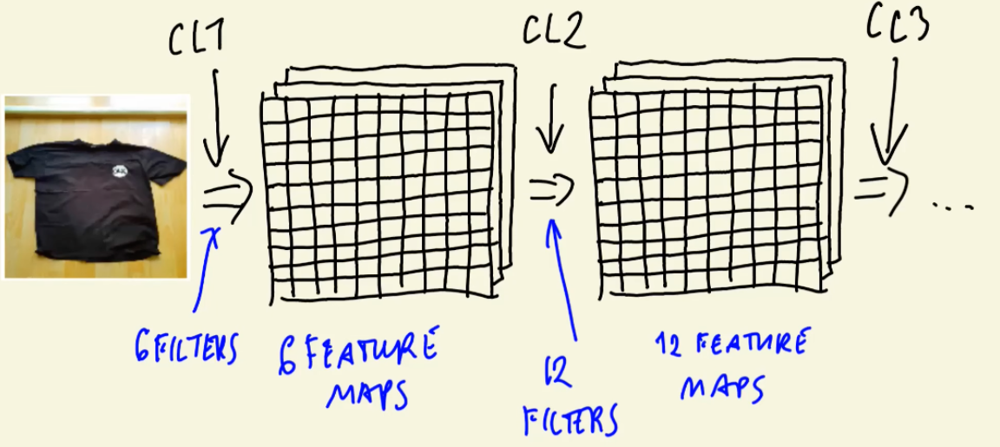

* The filters on each CL are increasingly complex, thus allowing us to recognize complex patterns. 
* An early CL might recognize simple shapes such as lines, but a later CL might recognize more complicated shapes such as squares or circles, and so on.
* Each layer progressively can select more and more complex features

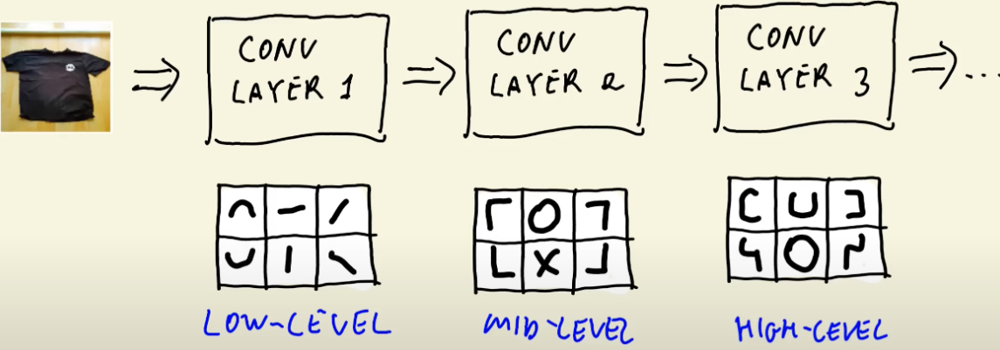

* Filters act on all feature maps at the same time. 
* If the input is 6 feature maps and there is only one filter, the output will be a single feature map because the filter looked at the same region in all of the input feature maps and compute the similarity value based on all of them.

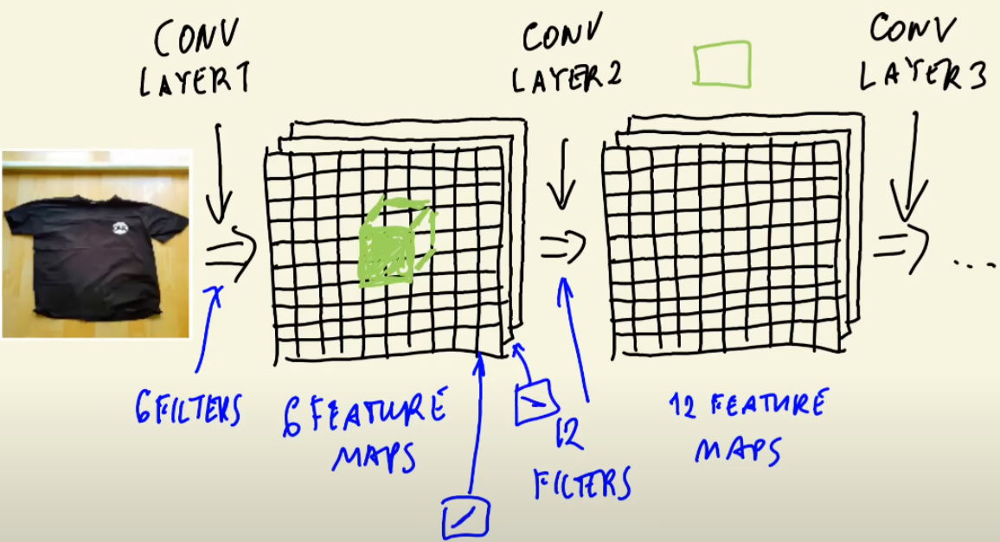

* Filters are learned; they are not predefined. 
* Training a CNN means training the filters.
* A final CL will usually output a flat 1-D vector. For example, our (299, 299, 3) image could be converted to a (2048) vector. This vector is called a **vector representation of the original image**.

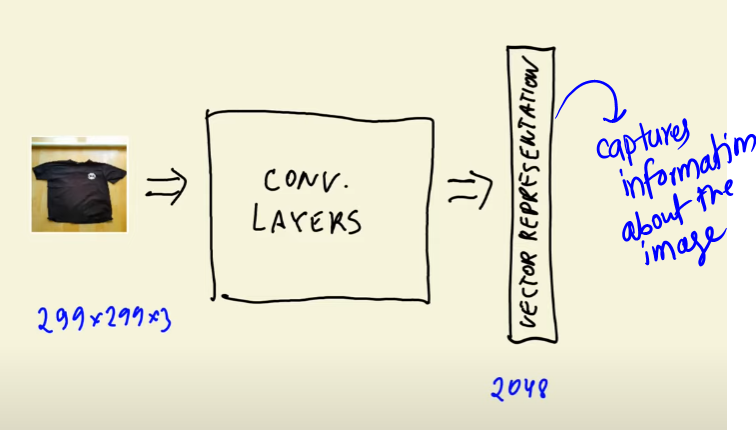

* Role of Convolutional Layer is to extract vector representation of the image
* Role of Dense Layer is to make predictions based on the extracted features

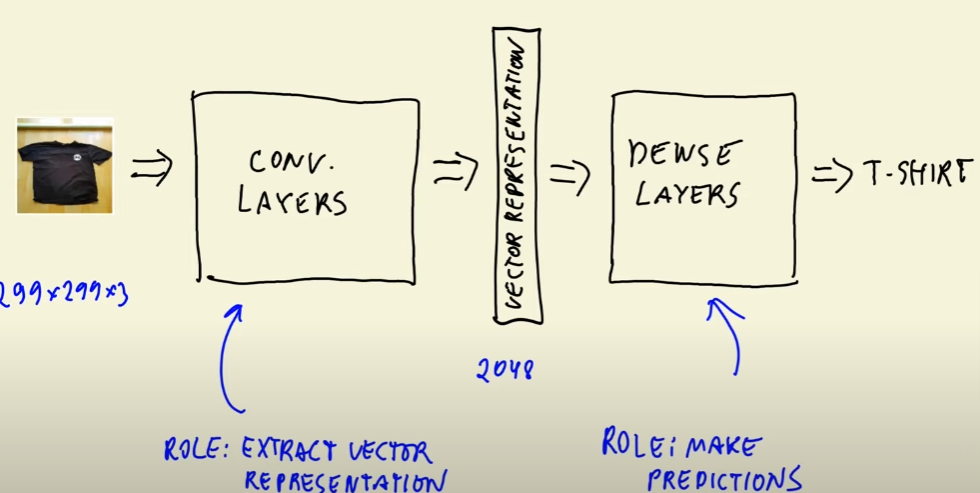

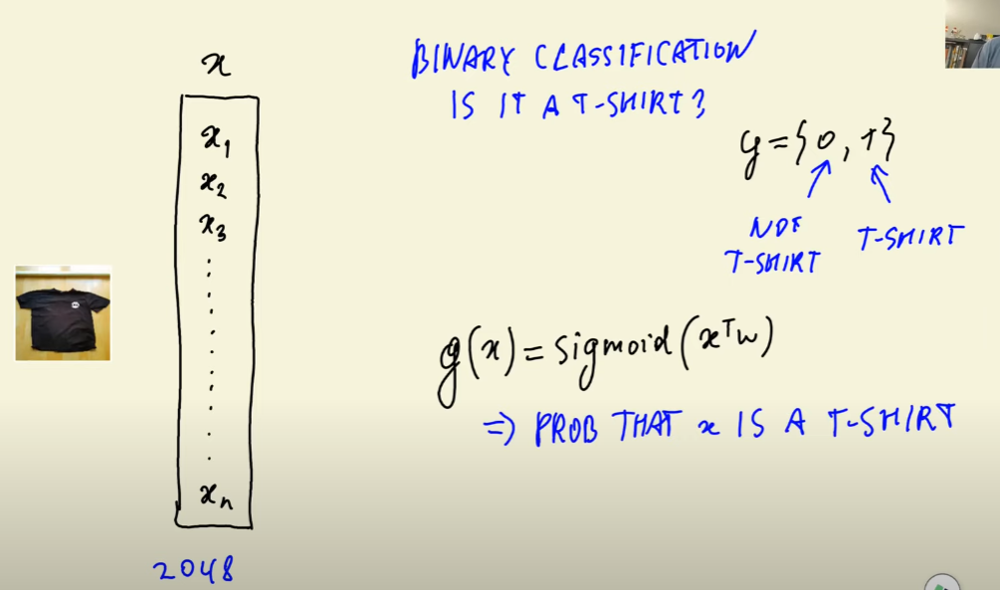

* A **pooling layer** is a special type of layer that is used along with convolutional layers. 
* It essentially reduces the size of the **feature maps**, thus **reducing the amount of parameters** we need to deal with.
* **Pooling layers** don't have weights that need to be trained. They just apply a simple operation on the feature maps, usually **average or max values**.
* The main hyperparameter in pooling layers is the **pooling window size**, which specifies the area of the image in which the pooling operation will take place.

    - For example, a max pooling layer with a pooling window of size (2,2) will take a 2x2 section of the image, keep the max value and discard the rest. 
    - This layer will eventually output a **feature map** whose sides have been halved in size.
* A **dense layer is made of **nodes (or neurons)** that apply linear and non-linear transformations to the input.

* Each node takes each component of the input and applies a linear transformation to them (multiplies each value with a weight, then adds all the elements together along with an optional bias, the node's own weight), which results in an output in the form of a single scalar. 
* The output then goes through an activation function (a non-linear transformation).
* The **outputs** of a dense layer **before going into its activation function** are called **logits**.

* Multiple nodes generate multiple outputs. Thus, the output of a dense layer is a vector.

* For binary classification, we could create a single deep layer with a single neuron that takes the vector representation of an image as input and outputs a single value. 
* This value could then go through a sigmoid activation function, which transforms the output to a value in the range [0,1]. 
* Thus, we get the probabilty that the image belongs to the category we want.

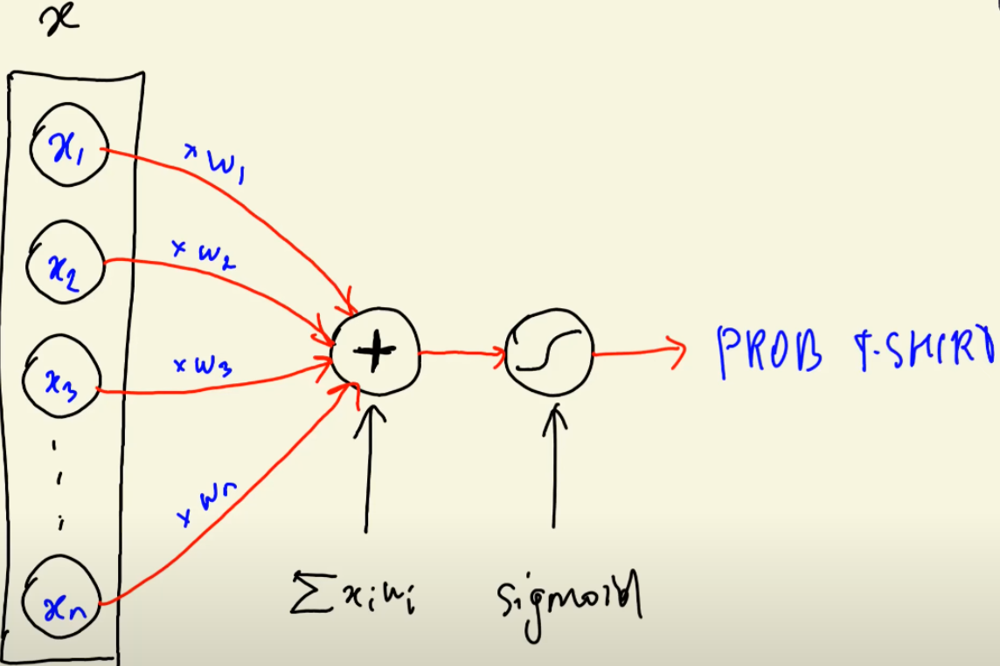

* For **multiclass classification**, instead of having **a single neuron** in our **dense layer**, we could have as many neurons as categories, and then apply a **softmax activation** function to the output vector, which is an extension of the **sigmoid function** for multiple values, thus **obtaining the probability for each category**.

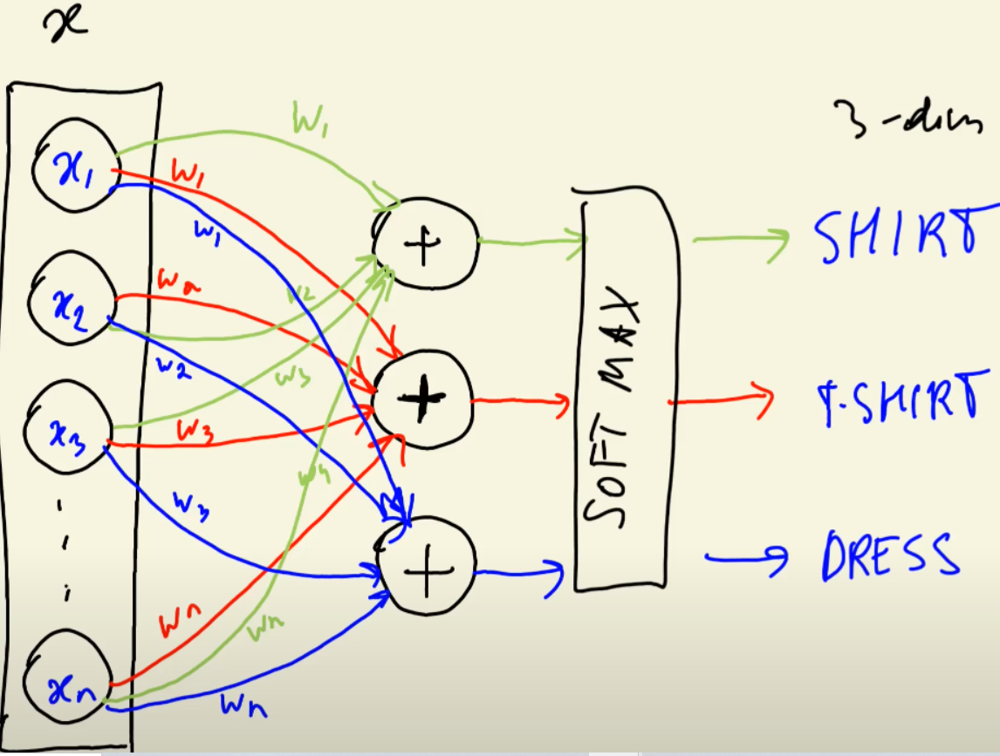

* In other words, this dense layers is a collection of multiple logistic regressions.

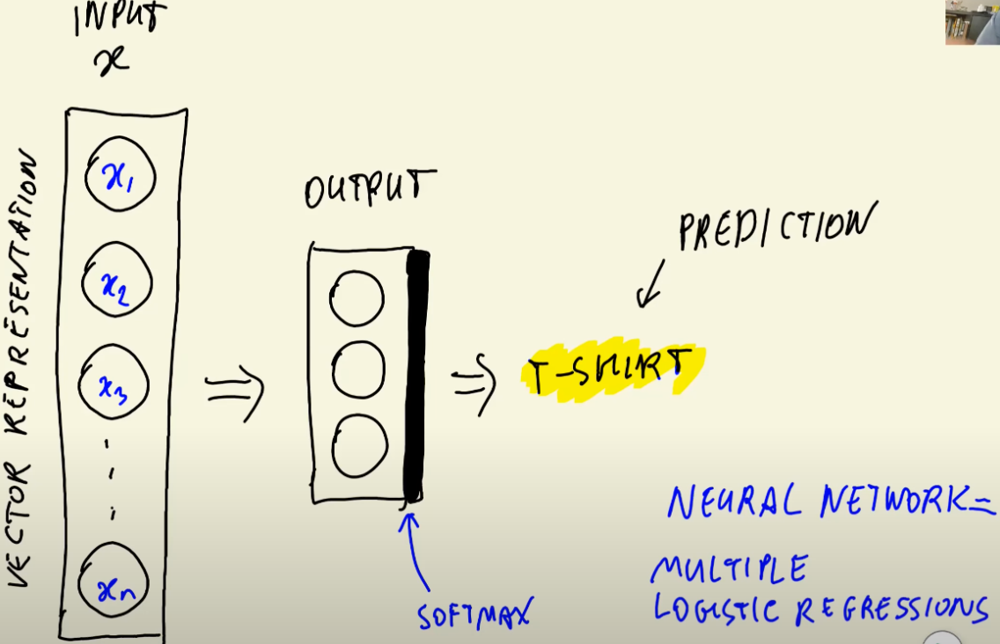

* **Sigmoid** for multiple classes is called **Softmax**

* A dense layer can connect to another dense layer. 
* The output of the first layer will be an internal vector representation that will be fed to the next dense layer. 
* We can connect as many dense layers as we want. These layers in between are called **hidden layers**.

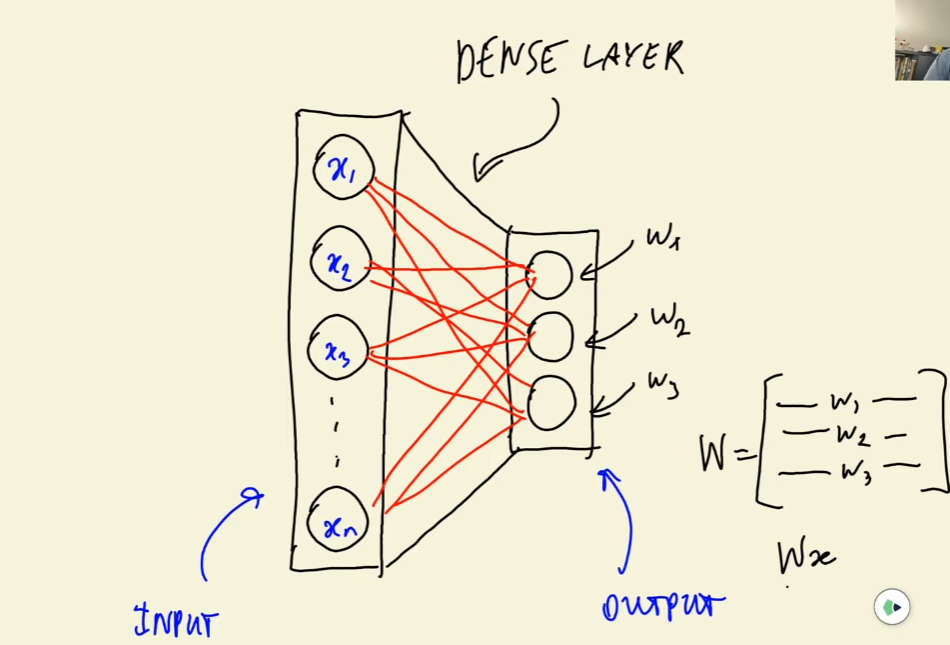

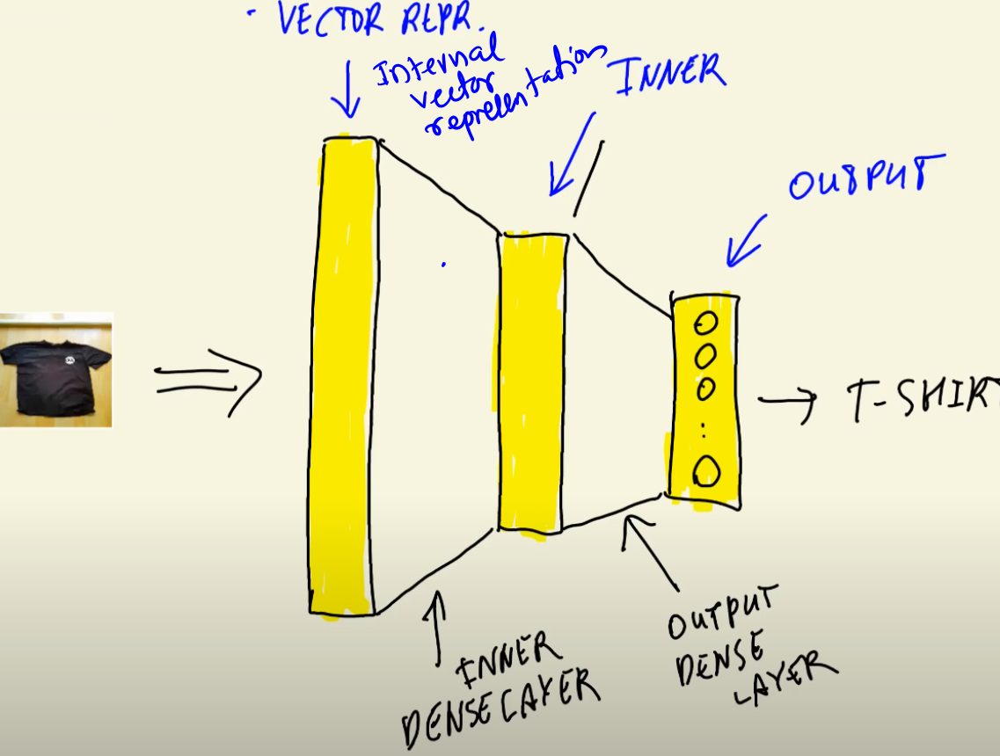

* A CNN uses both convolutional and dense layers in order to process images and make predictions. Here's a main overview of a CNN.


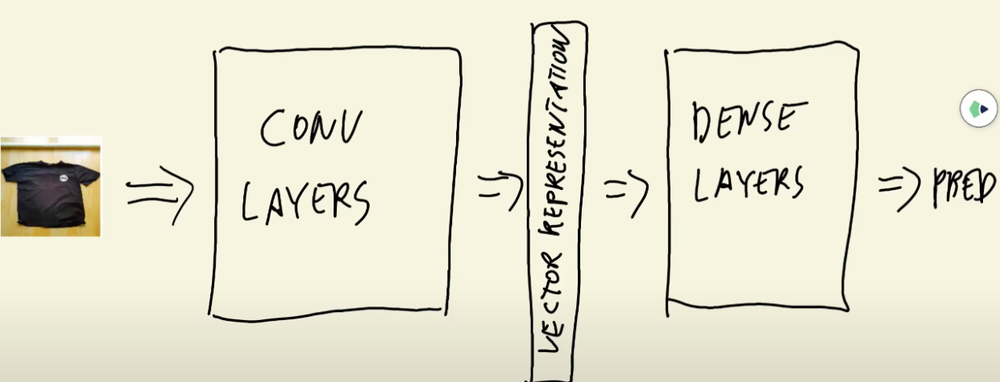

## Transfer Learning

We already saw that we **cannot use a pre-trained network for any task because the network was trained for a specific task. However, it's possible to reuse parts of the network. This is called **Transfer Learning**.

The idea is to **reuse the vector representation that the convolutional layers of the CNN create**, **but we discard the dense layers** and make our own for our specific task.

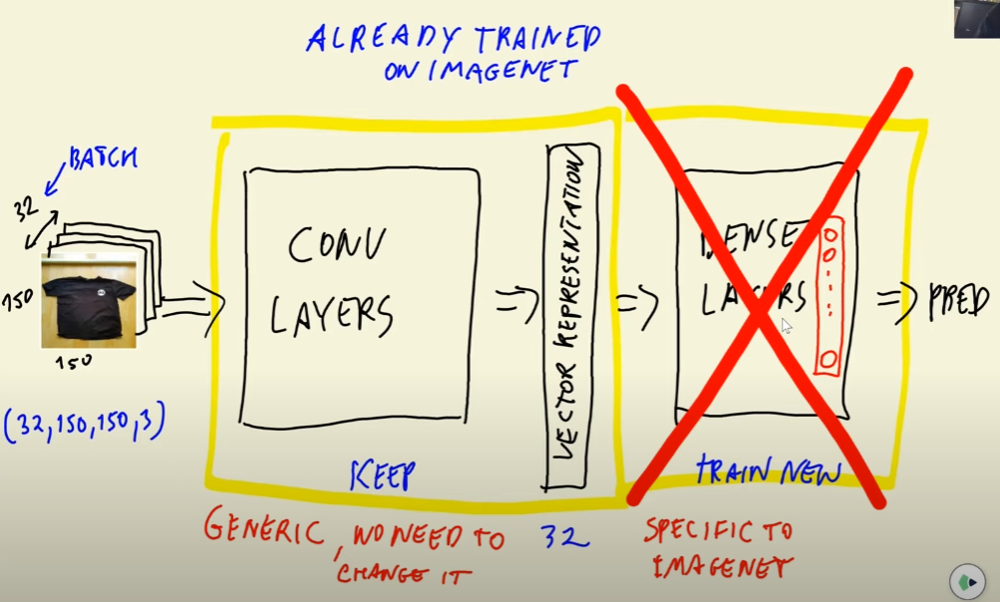

## Datasets

In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_gen = ImageDataGenerator(preprocessing_function=preprocess_input)
train_ds = train_gen.flow_from_directory('/content/clothing-dataset-small/train', target_size=(150, 150), batch_size=32, class_mode='categorical')

val_gen = ImageDataGenerator(preprocessing_function=preprocess_input)
val_ds = val_gen.flow_from_directory('/content/clothing-dataset-small/validation', target_size=(150, 150), batch_size=32, shuffle=False)

Found 3068 images belonging to 10 classes.
Found 341 images belonging to 10 classes.


* **ImageDataGenerator()** is a special class that allows us to create image datasets. We instantiate it in order to access its properties and functions.
* **preprocess_input** is the image preprocessing function imported in the previous example.
* **flow_from_diractory()** takes images from a directory and creates a dataset.
    - We set target_size=(150,150) because a 150x150 image is 1/4 the size of the original 299x299 images, so the training will be 4 times faster.
    - **batch_size** specifies the amount of images that the network will take every time.
    - Knowing the image and batch size, we can calculate that the input will be of size (32, 150, 150, 3), there will be 32 vector representations and 32 predictions as output.
    - class_mode specifies the kind of label arrays that are returned:
        - categorical is the default mode, for multicategory classification problems. 
    - Labels will be 2D one-hot encoded labels.
binary is for binary classification models. Labels will be 1D binary models.
    - There are more modes for other specific kind of problems (sparse, input) but they won't be covered here.
* For the validation dataset we disable shuffling, since it isn't really necessary.

* After creating the datasets, if we run train_ds.class_indices, we would get the categories that the dataset contains. 
* These categories match the name and amount of folders inside the specified directory, so if our directory has the folders cats and dogs, our dataset will contain those 2 categories.

In [17]:
X,y = next(train_ds)

In [18]:
train_ds.class_indices

{'dress': 0,
 'hat': 1,
 'longsleeve': 2,
 'outwear': 3,
 'pants': 4,
 'shirt': 5,
 'shoes': 6,
 'shorts': 7,
 'skirt': 8,
 't-shirt': 9}

In [19]:
y[:5]

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

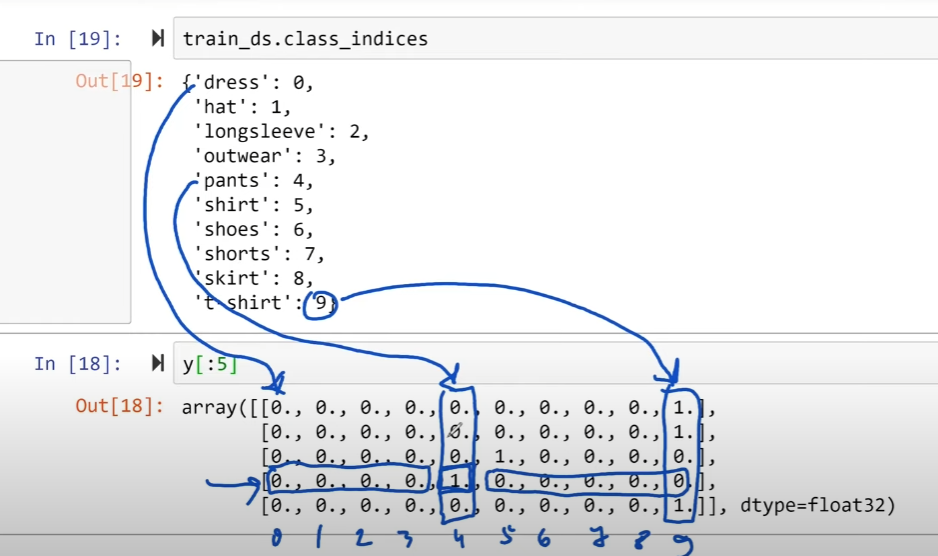

## Base Model 
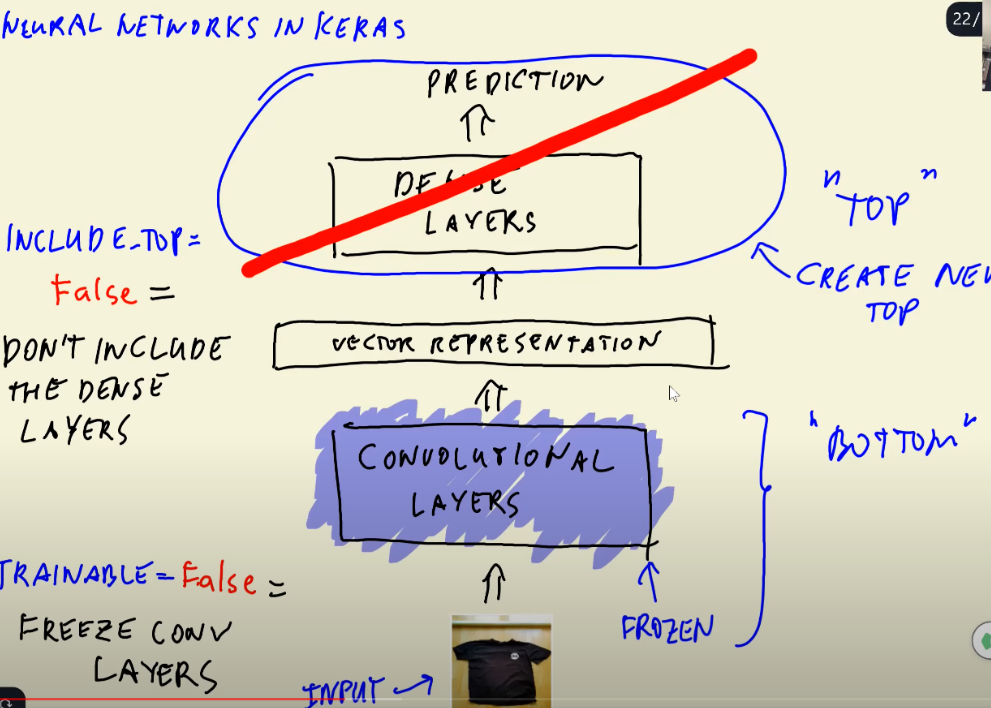

* In Keras terminology, the **top of a CNN is the dense layers**, and **the bottom is the convolutional part**. 
* We want to replace the Xception top with our own, so we set **include_top to False**.
* We don't want to retrain the convolutional part of the network, so **we freeze the convolutional layers** by setting our top-less model to **trainable = False**.

In [20]:
base_model = Xception(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
base_model.trainable = False

83683744/83683744 [==============================] - 7s 0us/step


## Final Model

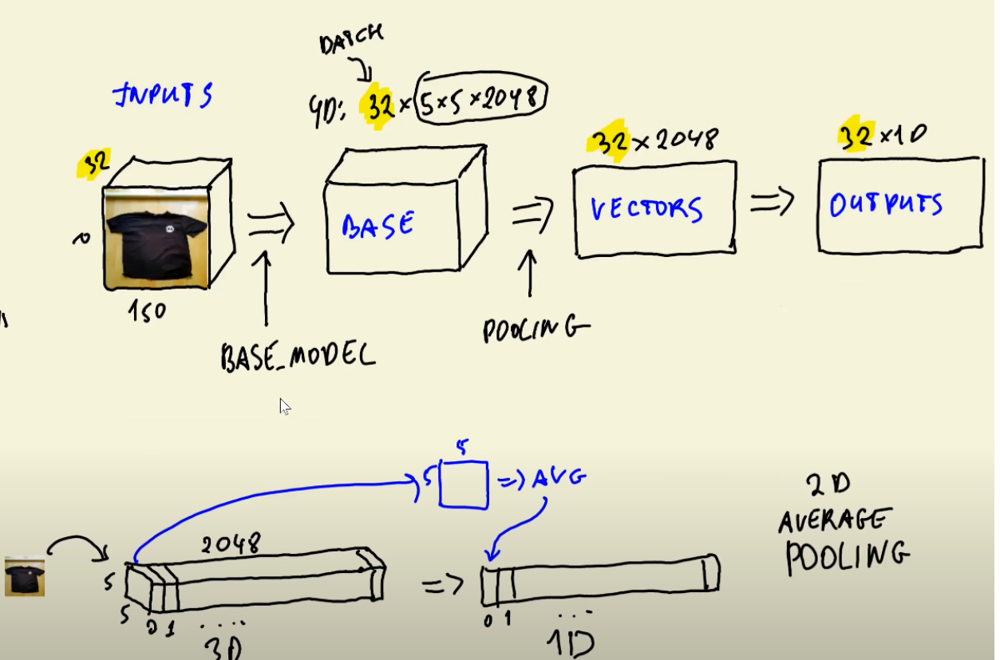

## Keras Functional API

In [21]:
inputs = keras.Input(shape=(150, 150, 3))
base = base_model(inputs, training=False)
vectors = keras.layers.GlobalAveragePooling2D()(base)
outputs = keras.layers.Dense(10)(vectors)
model = keras.Model(inputs, outputs)

In [22]:
preds = model.predict(X)

1/1 [==============================] - 2s 2s/step


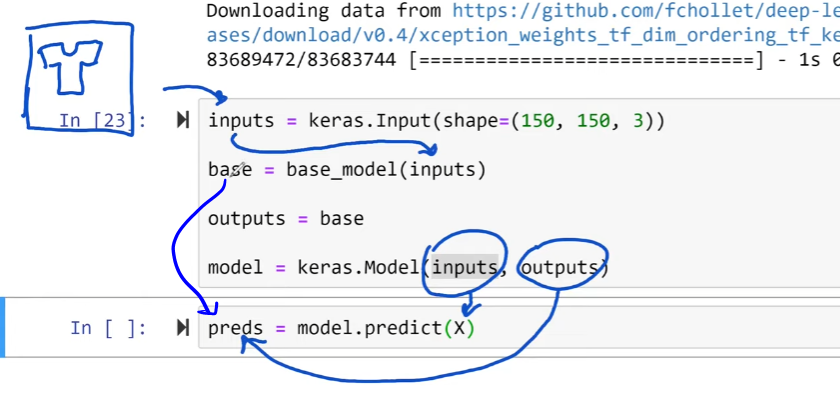

In [23]:
preds

array([[ 3.33445966e-01, -2.50831604e-01,  1.39289051e-01,
         2.13844344e-01,  8.93698096e-01,  5.04412651e-01,
         2.49580190e-01,  1.21015584e+00, -1.35317481e+00,
         8.05034757e-01],
       [-5.79432607e-01,  1.12427938e+00,  7.07764328e-02,
         1.03782570e+00, -4.19456244e-01,  3.22738349e-01,
         3.60428572e-01,  1.12623012e+00, -1.62671506e-01,
         1.01151717e+00],
       [ 1.20868027e-01, -9.32406783e-02,  3.11395884e-01,
        -3.46699655e-01,  1.10343266e+00,  6.48696184e-01,
        -3.48672032e-01,  8.08413506e-01, -7.86301672e-01,
         3.32022250e-01],
       [ 4.12661970e-01, -1.14305174e+00, -3.21007967e-01,
         7.17429280e-01, -1.43522561e+00,  8.84373188e-02,
         6.71751797e-03,  1.92348301e-01, -4.15741712e-01,
         1.57633352e+00],
       [ 3.90487969e-01,  1.94801480e-01, -7.06915975e-01,
         4.94374596e-02, -8.08440149e-01, -9.55842808e-02,
         1.67259634e-01,  1.29485822e+00,  2.09153533e-01,
         7.

In [24]:
decode_predictions(pred)

[[('n04525038', 'velvet', 0.14347564),
  ('n03877472', 'pajama', 0.124965705),
  ('n03595614', 'jersey', 0.12118909),
  ('n03594734', 'jean', 0.053121112),
  ('n04479046', 'trench_coat', 0.04725361)]]

## Training the model

* Our dense layer is not trained. When initialized, its weights are set to random values.

* The optimizer is the element which "trains" the values of the weights by changing them on each training iteration in a way to make the output of the network make sense.

* There are many optimizer algorithms. For our example we will use Adam.

* The **optimizer** also needs to know how to change the weights and check how good the changes are. 
* This is done with a **loss function**, which is a metric that **calculates the difference (loss) of the network's output with the target**.
*  We will use **CategoricalCrossentropy loss** function because we're dealing with a multiclass classification problem (if we were dealing with a regression problem, we could use **MeanSquaredError**)

In [25]:
learning_rate = 0.01
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
loss = keras.losses.CategoricalCrossentropy(from_logits=True)
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
model.fit(train_ds, epochs=10, validation_data=val_ds)

Epoch 1/10
96/96 [==============================] - 18s 167ms/step - loss: 1.2908 - accuracy: 0.6640 - val_loss: 1.0164 - val_accuracy: 0.7185
Epoch 2/10
96/96 [==============================] - 15s 154ms/step - loss: 0.5998 - accuracy: 0.8116 - val_loss: 0.8730 - val_accuracy: 0.7830
Epoch 3/10
96/96 [==============================] - 15s 159ms/step - loss: 0.3744 - accuracy: 0.8748 - val_loss: 0.9248 - val_accuracy: 0.7713
Epoch 4/10
96/96 [==============================] - 14s 148ms/step - loss: 0.2645 - accuracy: 0.9159 - val_loss: 0.7785 - val_accuracy: 0.7889
Epoch 5/10
96/96 [==============================] - 14s 146ms/step - loss: 0.1573 - accuracy: 0.9407 - val_loss: 0.8060 - val_accuracy: 0.8065
Epoch 6/10
96/96 [==============================] - 15s 153ms/step - loss: 0.0901 - accuracy: 0.9729 - val_loss: 0.8254 - val_accuracy: 0.8006
Epoch 7/10
96/96 [==============================] - 14s 142ms/step - loss: 0.0599 - accuracy: 0.9857 - val_loss: 0.8201 - val_accuracy: 0.8035

* **learning_rate** defines the "step size" when changing the values. 
    - Higher values train faster but might not be precise enough to find ideal values; 
    - lower values are more precise but are much slower to train.
* **keras.losses.CategoricalCrossentropy()** is our loss function.
* When from_logits is set to True, the loss function will take the logits (layer values before the Softmax activation function) for calculating the loss. This gives the network numerical stability. If we set ot to False, then we would have to modify a line in our previous code:
* outputs = keras.layers.Dense(10, activation='softmax')(vectors)
* We "tie" our model to our **optimizer**, **loss function** and **the metrics** we're interested in tracking with model.compile().
* **model.fit()** is where the actual training happens, with our training and validation datasets for training and measuring accuracy, respectively.
* **epochs** is the number of times that the algorithm will go through the data in order to train the model.

## Learning Rate Tells how fast the network can read.

Suppose we read 1 book a quarter then in 1 year we would read 4 books

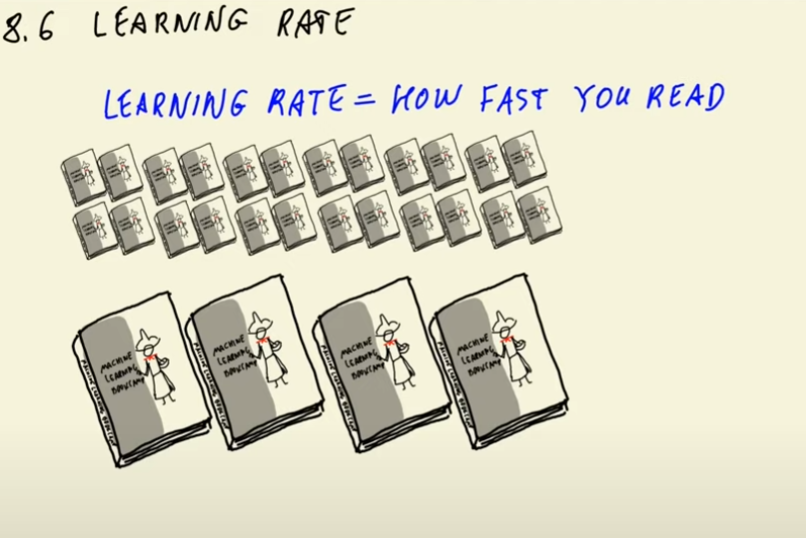

* read 1 book a year and learn through with perfection.It is the same with  learning rate in deep learning

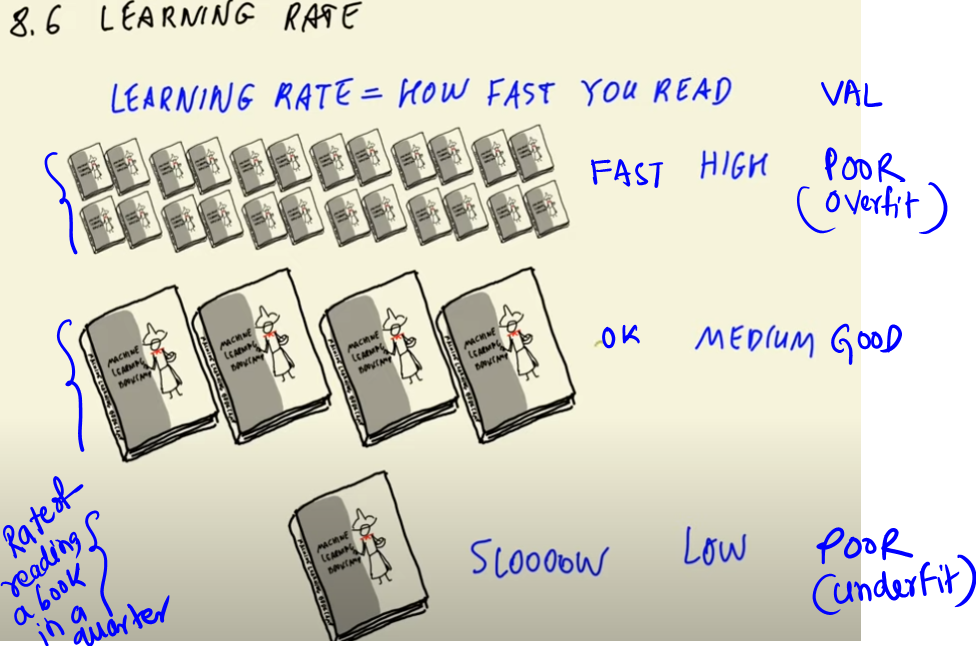

In the above illustration the one with Medium speed we will be able to  apply better on what we have learnt.


## Adjusting the Learning Rate

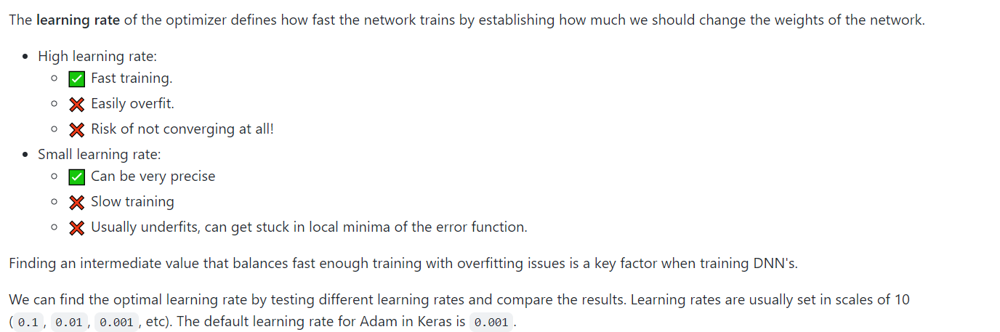

In [26]:
def make_model(learning_rate):
  optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
  loss = keras.losses.CategoricalCrossentropy(from_logits=True)
  model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
  return model

In [27]:
scores = {}

for lr in [0.0001, 0.001, 0.01, 0.1]:

    # make_model() is a custom function that creates all of the code we've seen in previous sections, except for model.fit()
    model = make_model(learning_rate=lr)

    history = model.fit(train_ds, epochs=10, validation_data=val_ds)
    scores[lr] = history.history

Epoch 1/10
96/96 [==============================] - 19s 168ms/step - loss: 0.0142 - accuracy: 0.9993 - val_loss: 0.8564 - val_accuracy: 0.8240
Epoch 2/10
96/96 [==============================] - 15s 158ms/step - loss: 0.0116 - accuracy: 0.9997 - val_loss: 0.8455 - val_accuracy: 0.8270
Epoch 3/10
96/96 [==============================] - 14s 144ms/step - loss: 0.0108 - accuracy: 0.9997 - val_loss: 0.8461 - val_accuracy: 0.8240
Epoch 4/10
96/96 [==============================] - 15s 152ms/step - loss: 0.0101 - accuracy: 0.9997 - val_loss: 0.8462 - val_accuracy: 0.8240
Epoch 5/10
96/96 [==============================] - 14s 147ms/step - loss: 0.0096 - accuracy: 0.9997 - val_loss: 0.8400 - val_accuracy: 0.8240
Epoch 6/10
96/96 [==============================] - 15s 157ms/step - loss: 0.0091 - accuracy: 0.9997 - val_loss: 0.8421 - val_accuracy: 0.8270
Epoch 7/10
96/96 [==============================] - 14s 147ms/step - loss: 0.0087 - accuracy: 0.9997 - val_loss: 0.8409 - val_accuracy: 0.8240

In [28]:
scores

{0.0001: {'loss': [0.014237172901630402,
   0.01158224605023861,
   0.010778508149087429,
   0.010070476680994034,
   0.009554938413202763,
   0.009068932384252548,
   0.008717573247849941,
   0.008305010385811329,
   0.008098687045276165,
   0.007861961610615253],
  'accuracy': [0.9993481040000916,
   0.9996740818023682,
   0.9996740818023682,
   0.9996740818023682,
   0.9996740818023682,
   0.9996740818023682,
   0.9996740818023682,
   0.9996740818023682,
   0.9996740818023682,
   0.9996740818023682],
  'val_loss': [0.856415867805481,
   0.8454973697662354,
   0.8461105227470398,
   0.8461703658103943,
   0.8400477766990662,
   0.8420988321304321,
   0.8408734798431396,
   0.8458679914474487,
   0.8409466743469238,
   0.8446031212806702],
  'val_accuracy': [0.8240469098091125,
   0.8269794583320618,
   0.8240469098091125,
   0.8240469098091125,
   0.8240469098091125,
   0.8269794583320618,
   0.8240469098091125,
   0.8240469098091125,
   0.8269794583320618,
   0.8240469098091125]},
 

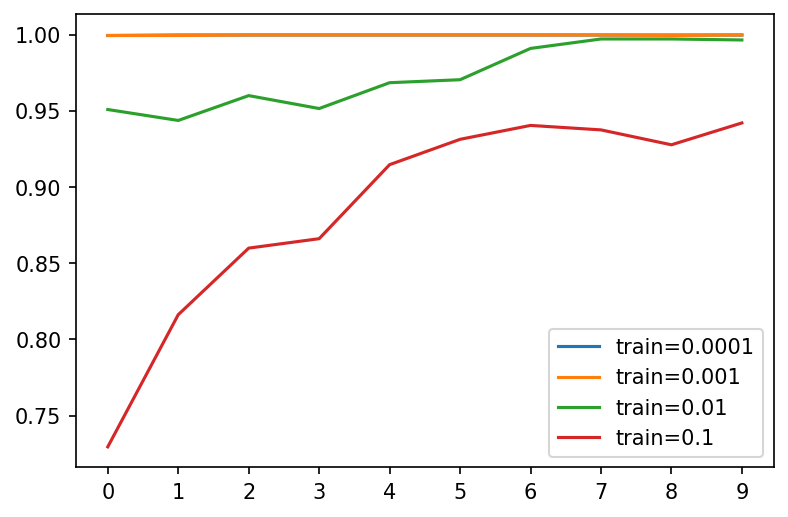

In [35]:
plt.figure(dpi=150)
for lr,hist in scores.items():
  plt.plot(hist['accuracy'],label=f'train={lr}')

plt.xticks(np.arange(10))
plt.legend()
plt.show()

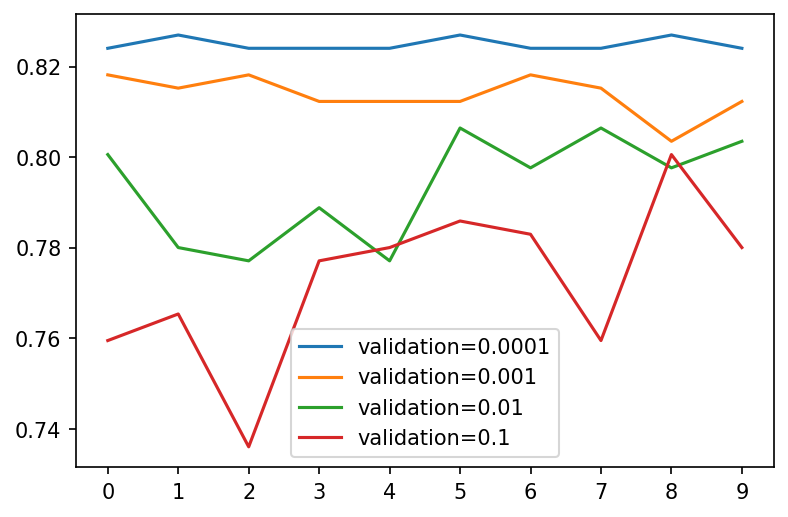

In [34]:
plt.figure(dpi=150)
for lr,hist in scores.items():
  plt.plot(hist['val_accuracy'],label=f'validation={lr}')

plt.xticks(np.arange(10))
plt.legend()
plt.show()

## Checkpointing
* Save the best model only
* Trainig the model with callbacks
* way of saving models at each iteration or epoch when certain conditions are satisfied.


When trying out different learning rates and plotting the results, you may observe that some iterations have better results than later iterations. This happens often. We can use checkpointing for saving intermediate training results instead of only keeping the latest, worse perfoming model.

Checkpointing consists of saving those models that perform better than previous ones. We do this by using a specific callback (a function that will be called after each epoch is finished).

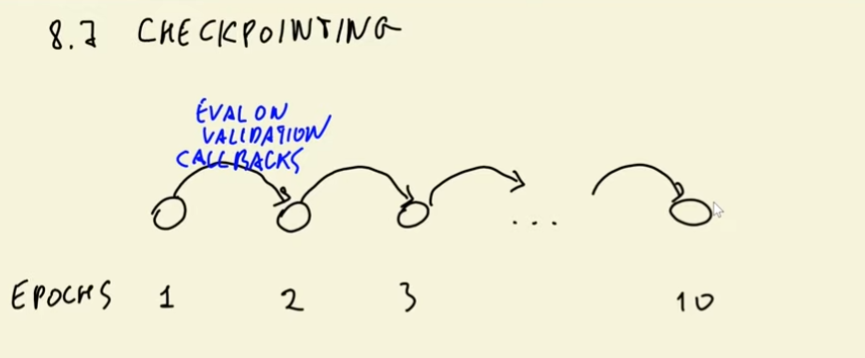

In [36]:
model.save_weights('model_v1.h5', save_format='h5')

checkpoint = keras.callbacks.ModelCheckpoint(
    'xception_v1_{epoch:02d}_{val_accuracy:.3f}.h5',#name of the file
    save_best_only=True,#save the model having best validation accuracy
    monitor='val_accuracy',
    mode='max'
)

learning_rate = 0.001

model = make_model(learning_rate=learning_rate)

history = model.fit(
    train_ds,
    epochs=10,
    validation_data=val_ds,
    callbacks=[checkpoint]
)

Epoch 1/10
96/96 [==============================] - 18s 159ms/step - loss: 0.4566 - accuracy: 0.9684 - val_loss: 9.6788 - val_accuracy: 0.7977
Epoch 2/10
96/96 [==============================] - 16s 164ms/step - loss: 0.2595 - accuracy: 0.9769 - val_loss: 9.4757 - val_accuracy: 0.7947
Epoch 3/10
96/96 [==============================] - 18s 184ms/step - loss: 0.1671 - accuracy: 0.9837 - val_loss: 9.3503 - val_accuracy: 0.7947
Epoch 4/10
96/96 [==============================] - 14s 150ms/step - loss: 0.1173 - accuracy: 0.9866 - val_loss: 9.3015 - val_accuracy: 0.7918
Epoch 5/10
96/96 [==============================] - 14s 150ms/step - loss: 0.0869 - accuracy: 0.9899 - val_loss: 9.2506 - val_accuracy: 0.7977
Epoch 6/10
96/96 [==============================] - 15s 161ms/step - loss: 0.0651 - accuracy: 0.9935 - val_loss: 9.2018 - val_accuracy: 0.7947
Epoch 7/10
96/96 [==============================] - 14s 143ms/step - loss: 0.0476 - accuracy: 0.9948 - val_loss: 9.2384 - val_accuracy: 0.7977

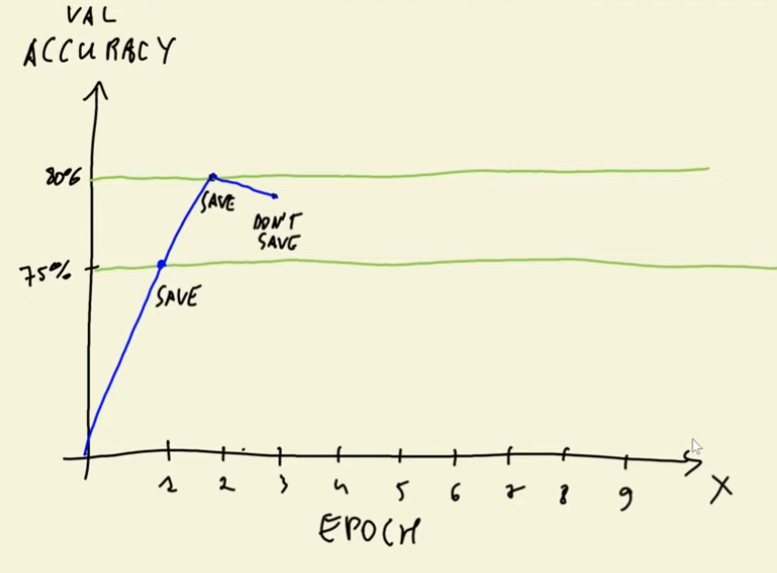

* h5 format is a format for storing model weights in a binary file.
* The ModelCheckpoint() callback function stores the model in a file.
    - The file name template uses Python's format() notation for strings. 
        - In this example there are two additional variables inside the string:
epoch will contain the number of epochs in 02d format, which means that it will be a 2 digit number with a zero in front of it in the case of being a single digit.
     - val_accuracy will contain the accuracy when evaluating with the validation dataset in 3f format, which means it will contain up to 3 decimal digits.
* save_best_only=True means we will only save the best model until that point.
monitor contains the metric we want to monitor; in our case, val_accuracy.
* mode='max' because we want the max accuracy.

* Note the additional callbacks=[checkpoint] in the fit() function. callbacks contains a list of callback functions we want to call after each epoc

## Adding more layers

The power of DNN's lay in their layers. Additional layers in networks allow them to make better predictions.

We can add an additional dense layer in our model along with an activation function. Using the code from this section, we add an additional line and slightly another:

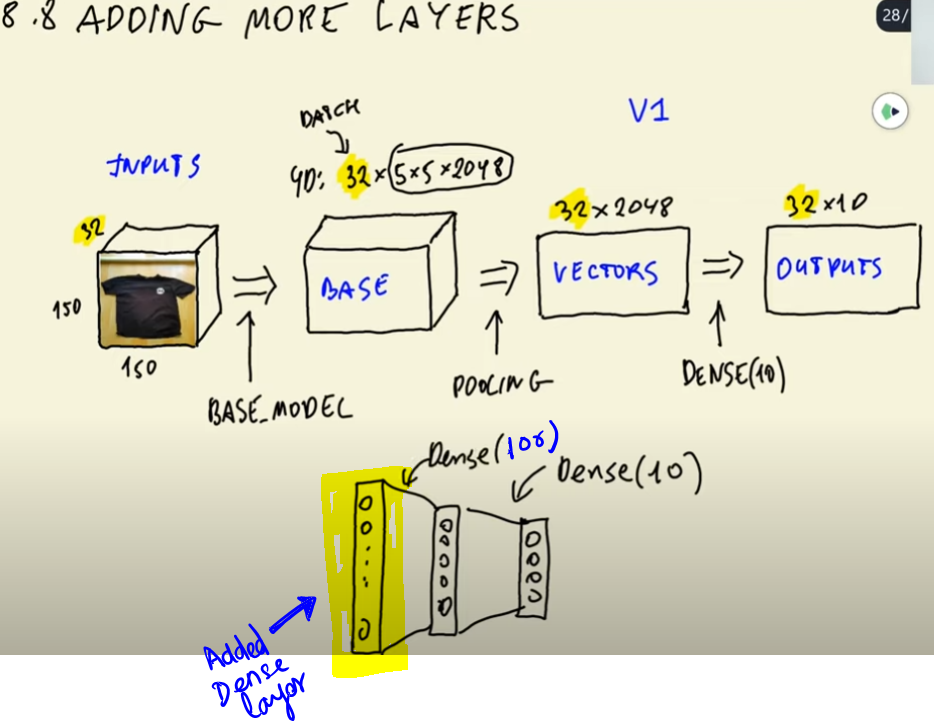

In [37]:
inputs = keras.Input(shape=(150, 150, 3))
base = base_model(inputs, training=False)
vectors = keras.layers.GlobalAveragePooling2D()(base)

# Defining the numnber of nodes of our inner layer
size_inner = 100

# This is the new line
inner = keras.layers.Dense(size_inner, activation='relu')(vectors)

outputs = keras.layers.Dense(10)(inner)

model = keras.Model(inputs, outputs)

In [38]:
 model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 xception (Functional)       (None, 5, 5, 2048)        20861480  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_1 (Dense)             (None, 100)               204900    
                                                                 
 dense_2 (Dense)             (None, 10)                1010      
                                                                 
Total params: 21,067,390
Trainable params: 205,910
Non-trainable params: 20,861,480
_________________________________________

* The inner layer takes the output from the pooling layer as input.
* The size_inner variable could be passed as a parameter when calling a function that invokes this code, thus making it a hyperparameter.
* We use ReLU as the actication function for our inner layer.
* Our final layer outputs now takes the output from the inner layer as input.
* Our final layer does not use an activation function because in this section we specified that our loss function would take logits for its computations.
* Since we define size_inner as a hyperparameter, we can also tune it when training our model.

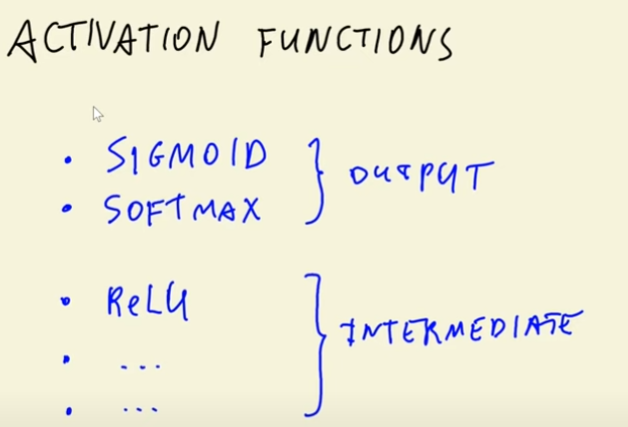

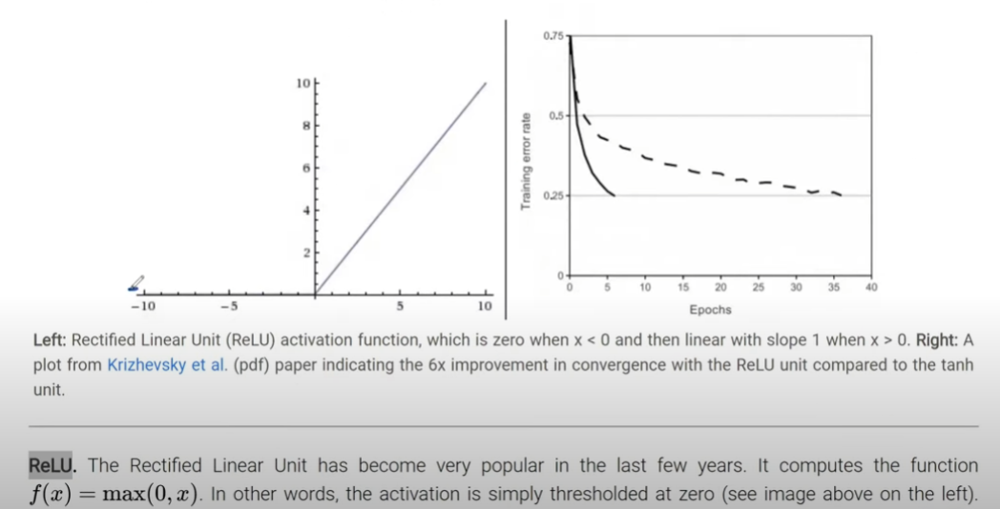

In [39]:
def make_model(learning_rate,size_inner):
  inputs = keras.Input(shape=(150, 150, 3))
  base = base_model(inputs, training=False)
  vectors = keras.layers.GlobalAveragePooling2D()(base)
  # This is the new line
  inner = keras.layers.Dense(size_inner, activation='relu')(vectors)

  outputs = keras.layers.Dense(10)(inner)

  model = keras.Model(inputs, outputs)
  optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
  loss = keras.losses.CategoricalCrossentropy(from_logits=True)
  model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
  return model

In [40]:
learning_rate = 0.001

scores = {}

for size in [10, 100, 1000]:
    model = make_model(learning_rate=learning_rate, size_inner=size)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds)
    scores[size] = history.history

Epoch 1/10
96/96 [==============================] - 19s 168ms/step - loss: 1.8753 - accuracy: 0.2826 - val_loss: 1.5636 - val_accuracy: 0.5572
Epoch 2/10
96/96 [==============================] - 14s 148ms/step - loss: 1.2598 - accuracy: 0.6164 - val_loss: 1.0528 - val_accuracy: 0.6774
Epoch 3/10
96/96 [==============================] - 15s 159ms/step - loss: 0.9036 - accuracy: 0.6975 - val_loss: 0.8745 - val_accuracy: 0.7126
Epoch 4/10
96/96 [==============================] - 16s 162ms/step - loss: 0.7402 - accuracy: 0.7467 - val_loss: 0.8081 - val_accuracy: 0.7507
Epoch 5/10
96/96 [==============================] - 16s 167ms/step - loss: 0.6434 - accuracy: 0.7842 - val_loss: 0.7775 - val_accuracy: 0.7595
Epoch 6/10
96/96 [==============================] - 16s 168ms/step - loss: 0.5727 - accuracy: 0.8103 - val_loss: 0.7419 - val_accuracy: 0.7830
Epoch 7/10
96/96 [==============================] - 15s 156ms/step - loss: 0.5022 - accuracy: 0.8279 - val_loss: 0.6975 - val_accuracy: 0.7830

* Adding layers increases complexity

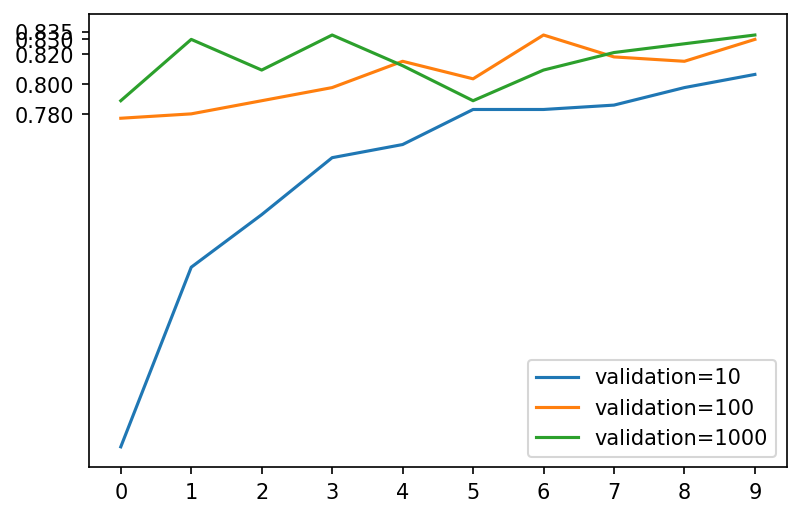

In [47]:
plt.figure(dpi=150)
for lr,hist in scores.items():
  plt.plot(hist['val_accuracy'],label=f'validation={lr}')

plt.xticks(np.arange(10))
plt.yticks([0.78,0.80,0.82,0.83,0.835])
plt.legend()
plt.show()

In [43]:
! nvidia-smi

Sat Nov 12 18:57:06 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   69C    P0    30W /  70W |   7224MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Regularization and dropout

Depending on the dataset, we risk overfitting our network and make it learn biases that distort the results. For example, if we want the network to recognize images of t-shirts and the t-shirts have logos on them, the network could learn to recognize those logos as the "t-shirt" category rather than the actual shape of the t-shirt.

If we were to "block" parts of the image with black squares in a way that would still make the object recognizable, the network may discard some features in favor of more important ones (like the logos in our example, or elements in the background), thus improving its performance.

Dropout is a technique that simulates this behavior. Instead of blocking parts of the image, we simply "freeze" nodes so that certain features don't propagate. On each epoch, we freeze different nodes, which means that their values are not updated.

In Keras, dropout is defined as an additional special layer.

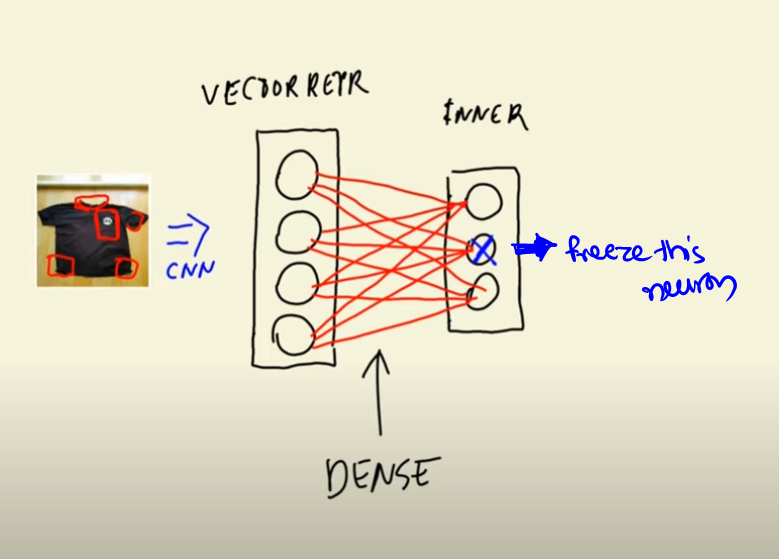

In [48]:
def make_model(learning_rate,size_inner,drop_rate):
  inputs = keras.Input(shape=(150, 150, 3))
  base = base_model(inputs, training=False)
  vectors = keras.layers.GlobalAveragePooling2D()(base)
  # Defining the droprate
  inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
  drop = keras.layers.Dropout(drop_rate)(inner)
  outputs = keras.layers.Dense(10)(drop)

  model = keras.Model(inputs, outputs)
  optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
  loss = keras.losses.CategoricalCrossentropy(from_logits=True)
  model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
  return model

* The droprate defines how much of the layer will freeze, defined as a value in the range [0,1]. 
* The frozen nodes are random and change after every epoch.
    - In our example, 0.5 means that half of the nodes will freeze on each epoch.
* We define the special layer drop and take the output of inner.

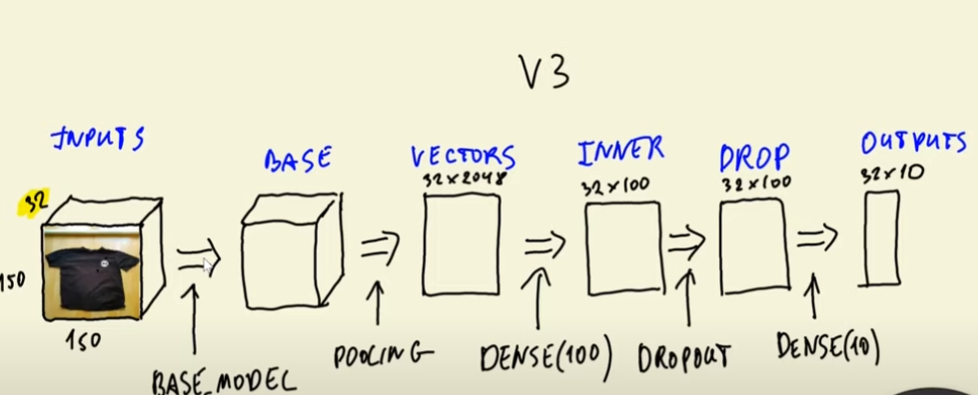

In [49]:
learning_rate = 0.001
size = 100
scores = {}

for drop in [0.0,0.2,0.5,0.8]:
    model = make_model(learning_rate=learning_rate, size_inner=size,drop_rate=drop)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds)
    scores[drop] = history.history

Epoch 1/10
96/96 [==============================] - 18s 161ms/step - loss: 0.9916 - accuracy: 0.6555 - val_loss: 0.6634 - val_accuracy: 0.7801
Epoch 2/10
96/96 [==============================] - 14s 145ms/step - loss: 0.4955 - accuracy: 0.8243 - val_loss: 0.5541 - val_accuracy: 0.8299
Epoch 3/10
96/96 [==============================] - 15s 152ms/step - loss: 0.3569 - accuracy: 0.8866 - val_loss: 0.5615 - val_accuracy: 0.8182
Epoch 4/10
96/96 [==============================] - 15s 161ms/step - loss: 0.2539 - accuracy: 0.9228 - val_loss: 0.5389 - val_accuracy: 0.8211
Epoch 5/10
96/96 [==============================] - 14s 145ms/step - loss: 0.1737 - accuracy: 0.9553 - val_loss: 0.5642 - val_accuracy: 0.8240
Epoch 6/10
96/96 [==============================] - 15s 152ms/step - loss: 0.1352 - accuracy: 0.9661 - val_loss: 0.5976 - val_accuracy: 0.8328
Epoch 7/10
96/96 [==============================] - 14s 145ms/step - loss: 0.0901 - accuracy: 0.9850 - val_loss: 0.6086 - val_accuracy: 0.8270

In [51]:
scores

{100: {'loss': [1.8359723091125488,
   1.3884694576263428,
   1.286441445350647,
   1.2258316278457642,
   1.130538821220398,
   1.0434433221817017,
   1.0315735340118408,
   0.9711514711380005,
   0.989755392074585,
   0.963451623916626],
  'accuracy': [0.3839634954929352,
   0.5182529091835022,
   0.5391134023666382,
   0.5521512627601624,
   0.5867014527320862,
   0.6199478507041931,
   0.6189700365066528,
   0.6492829322814941,
   0.6404824256896973,
   0.6466753482818604],
  'val_loss': [1.0989130735397339,
   0.9166793823242188,
   0.8812687993049622,
   0.8007762432098389,
   0.7348136305809021,
   0.718683123588562,
   0.6853100061416626,
   0.6630848050117493,
   0.6450512409210205,
   0.6322973966598511],
  'val_accuracy': [0.6510263681411743,
   0.7126099467277527,
   0.7272727489471436,
   0.7302052974700928,
   0.7653958797454834,
   0.7712609767913818,
   0.7976539731025696,
   0.7800586223602295,
   0.7829912304878235,
   0.8005865216255188]}}

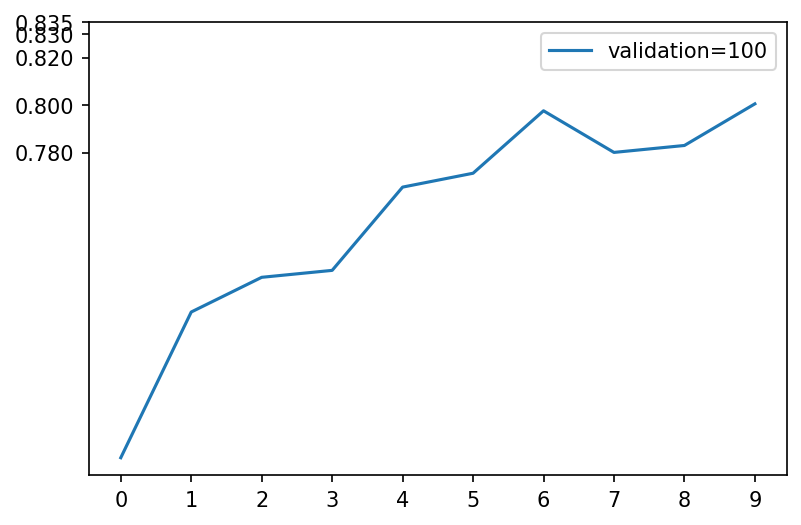

In [50]:
plt.figure(dpi=150)
for droprate,hist in scores.items():
  plt.plot(hist['val_accuracy'],label=f'validation={droprate}')

plt.xticks(np.arange(10))
plt.yticks([0.78,0.80,0.82,0.83,0.835])
plt.legend()
plt.show()